# Data Exploration

This Notebook explores the weather data taken from the visualcrossing weather API

Calling the API and then extracting/saving the data was done in the data_retrival.py script on the main directory of this repo.
If you wish to use it yourself then you will need to request an API key from the provider

For more info:
https://www.visualcrossing.com/resources/documentation/weather-api/timeline-weather-api/

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
from dataprep.eda import create_report
import warnings
warnings.filterwarnings("ignore")

#### Function to plot time series data

In [1]:
def plotSeries(df, col):
    """creates time series plots"""
    plt.rc('font', size=12)
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.plot(df['datetime'], df[col], label=col)
    ax.set_xlabel('Time')
    ax.set_ylabel(col)
    ax.set_title(col.upper())
    ax.grid(True)
    ax.legend(loc='upper left')

#### Load and inspect data

In [5]:
#load data
df = pd.read_csv('../Data/weather_data.csv')

#quick look at the columns
df.head()

,datetime,datetimeEpoch,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,...,sunriseEpoch,sunset,sunsetEpoch,moonphase,conditions,description,icon,stations,source,tzoffset
0,16/10/2014,1413414000,16.8,11.4,13.8,16.8,11.4,13.8,12.0,89.37,...,1413440810,18:05:47,1413479147,0.79,Rain,Clear conditions throughout the day with rain.,rain,"['03680099999', '03660099999', '03672099999', ...",obs,NaN
1,17/10/2014,1413500400,18.0,12.6,15.1,18.0,12.6,15.2,13.1,88.22,...,1413527314,18:03:39,1413565419,0.83,Rain,Clear conditions throughout the day with rain.,rain,"['03680099999', '03660099999', '03672099999', ...",obs,NaN
2,18/10/2014,1413586800,18.5,15.6,17.0,18.5,15.6,17.0,14.6,85.57,...,1413613818,18:01:31,1413651691,0.88,Rain,Partly cloudy throughout the day with rain.,rain,"['03680099999', '03660099999', '03672099999', ...",obs,NaN
3,19/10/2014,1413673200,18.3,13.8,16.1,18.3,13.8,16.1,12.7,81.05,...,1413700322,17:59:25,1413737965,0.92,Rain,Clear conditions throughout the day with rain.,rain,"['03680099999', '03660099999', '03672099999', ...",obs,NaN
4,20/10/2014,1413759600,15.5,11.5,13.1,15.5,11.5,13.1,10.0,81.75,...,1413786826,17:57:20,1413824240,0.95,Rain,Clear conditions throughout the day with rain.,rain,"['03680099999', '03660099999', '03672099999', ...",obs,NaN


We only need one of the datetime columns.

We'll consider the value of each series once we have plotted them.

Sunrise/Sunset is of no interest to this project.

The last 3 columns are of no use either

In [6]:
#drop unneeded columns
cols_drop = ['datetimeEpoch', 'sunrise', 'sunriseEpoch', 'sunset',\
             'sunsetEpoch', 'stations', 'source', 'tzoffset']
    
df = df.drop(cols_drop, axis=1)
    
#check data types
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2400 entries, 0 to 2399
Data columns (total 28 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   datetime        2400 non-null   object 
 1   tempmax         2400 non-null   float64
 2   tempmin         2400 non-null   float64
 3   temp            2400 non-null   float64
 4   feelslikemax    2400 non-null   float64
 5   feelslikemin    2400 non-null   float64
 6   feelslike       2395 non-null   float64
 7   dew             2400 non-null   float64
 8   humidity        2400 non-null   float64
 9   precip          2400 non-null   float64
 10  precipprob      0 non-null      float64
 11  precipcover     2400 non-null   float64
 12  preciptype      0 non-null      float64
 13  snow            2200 non-null   float64
 14  snowdepth       2201 non-null   float64
 15  windgust        1174 non-null   float64
 16  windspeed       2400 non-null   float64
 17  winddir         2400 non-null   f

datetime may benefit from being in datetime format

We can remove columns with only null values

In [7]:
#drop unneeded columns pt.2
cols_drop = ['precipprob', 'preciptype']
    
df = df.drop(cols_drop, axis=1)

#convert to datetime
df['datetime'] = pd.to_datetime(df['datetime'], format='%d/%m/%Y')

#summary stats
df.describe()

,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,precip,precipcover,...,windgust,windspeed,winddir,pressure,cloudcover,visibility,solarradiation,solarenergy,uvindex,moonphase
count,2400.000000,2400.000000,2400.000000,2400.000000,2400.000000,2395.000000,2400.000000,2400.000000,2400.000000,2400.000000,...,1174.000000,2400.000000,2400.000000,2399.000000,2400.000000,2400.000000,763.000000,763.000000,2400.000000,2400.000000
mean,14.117792,6.922042,10.509625,13.503083,5.543125,9.512359,6.749500,79.538704,2.285079,6.049375,...,29.547615,11.631125,199.011042,1015.459817,17.544292,14.209625,204.894233,10.144168,1.595000,0.501854
std,6.260846,4.896849,5.379532,7.002622,5.917454,6.343769,4.667717,10.377831,4.280130,5.284278,...,8.874682,5.510562,74.630607,10.650620,8.796742,5.812483,125.625597,7.704638,2.861128,0.307729
min,-2.700000,-5.900000,-4.500000,-7.800000,-13.400000,-10.900000,-8.700000,43.110000,0.000000,0.000000,...,0.000000,1.100000,14.800000,974.900000,0.000000,0.300000,19.000000,0.500000,0.000000,0.000000
25%,9.400000,3.200000,6.400000,7.900000,0.800000,4.500000,3.200000,72.030000,0.000000,0.000000,...,24.200000,7.800000,150.775000,1009.100000,11.900000,9.600000,99.700000,3.700000,0.000000,0.250000
50%,13.400000,6.700000,10.100000,13.350000,5.200000,9.500000,6.800000,80.600000,0.410000,4.170000,...,30.000000,11.500000,219.750000,1016.700000,17.700000,14.500000,176.800000,7.700000,0.000000,0.500000
75%,18.800000,10.700000,14.700000,18.800000,10.700000,14.700000,10.300000,87.692500,2.490000,8.330000,...,34.400000,15.000000,255.125000,1022.600000,22.600000,18.600000,301.250000,16.200000,2.000000,0.760000
max,36.200000,20.000000,27.300000,37.000000,20.000000,27.600000,18.500000,99.370000,39.230000,17.390000,...,63.800000,36.900000,337.400000,1047.900000,91.900000,29.900000,508.500000,30.200000,10.000000,1.000000


Since this is a time series problem, I'm not really looking for quite the same things as if it were a regression problem e.g. skewness

Interesting to see that the variability differs between the 3 temp metrics.

I dont see any extreme min or max values that would indicate data anomalies.

See nothing for Snow which cant be right given i live in the area and distinctly remember plenty of snow over the years. We'll drop these.


In [8]:
#drop unneeded columns pt.3
cols_drop = ['snow', 'snowdepth']
    
df = df.drop(cols_drop, axis=1)

#### Auto EDA
I Like pandas profiling library but lets try an alternative for this EDA

  0%|                                                                                         | 0/3578 [00:00<…

Weather_data_EDA
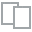
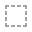
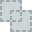
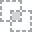
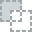
...
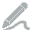
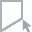
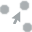
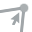
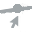

In [9]:
report = create_report(df, title='Weather_data_EDA')
report

tempmax is skewed unlike other temps.

precip shows that there is no rain one in three days. this is confirmed by the conditions columns. Love London!

winddir showing that the prevaling wind comes from the Atlantic as expected.

cloudcover showing that the will always be some clouds hanging about. Rare for it to be over 30% though.

Interesting inverse correlation between humidty and solar radiation. Otherwise the correlations amongst the other variables come at no surprise.

#### Time series plots

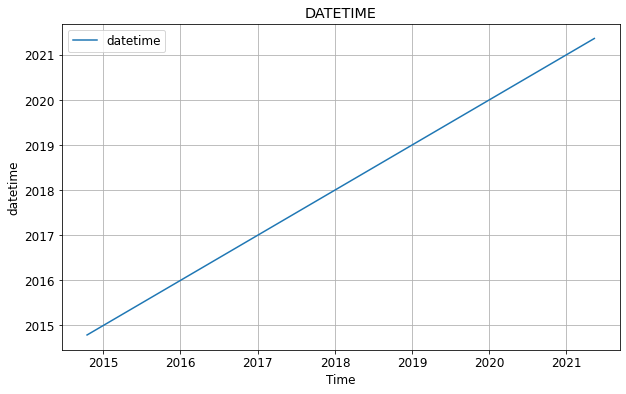

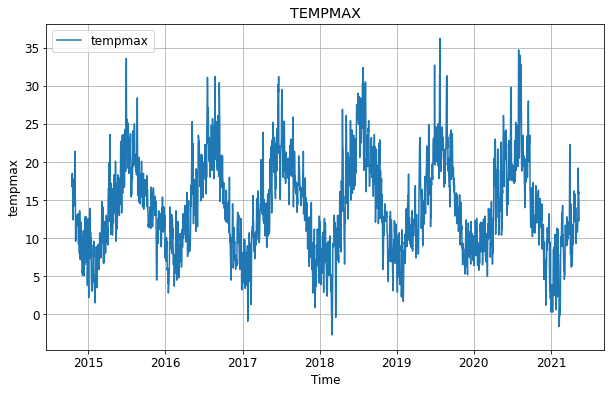

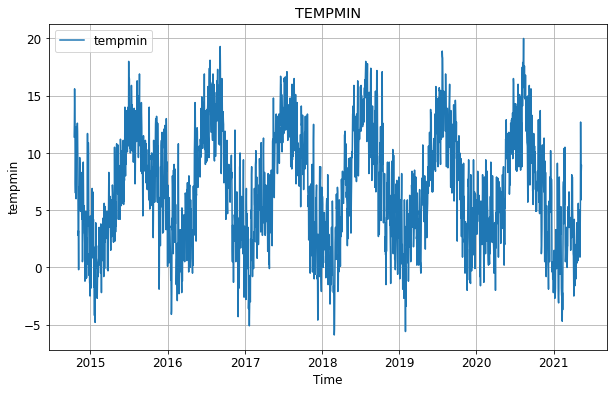

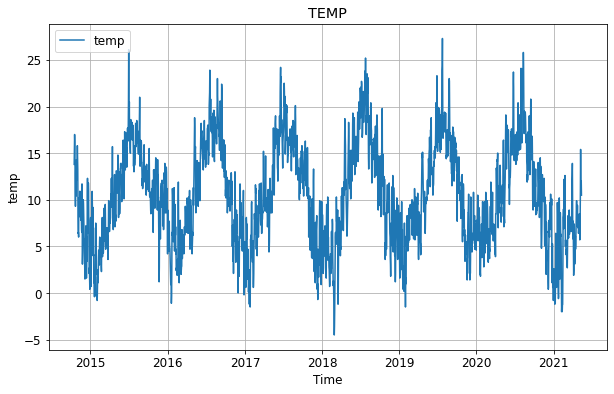

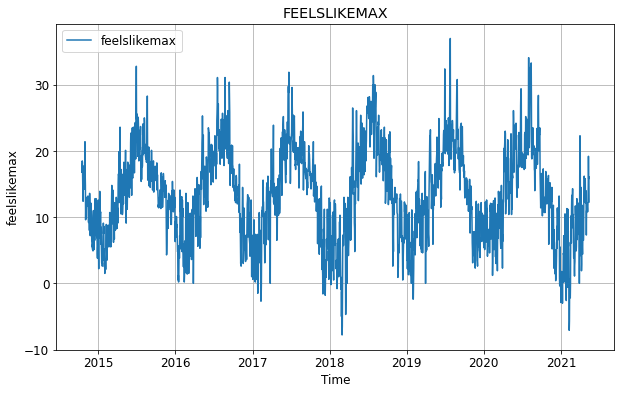

...

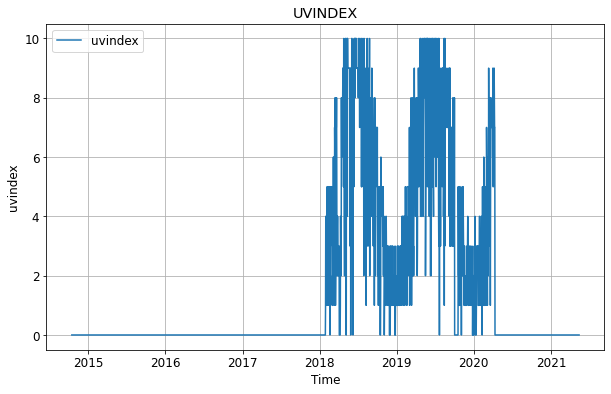

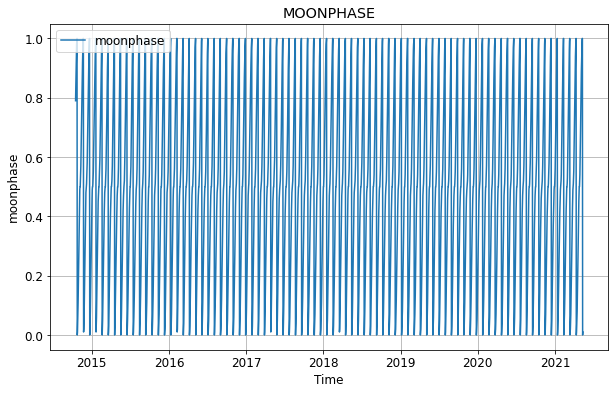

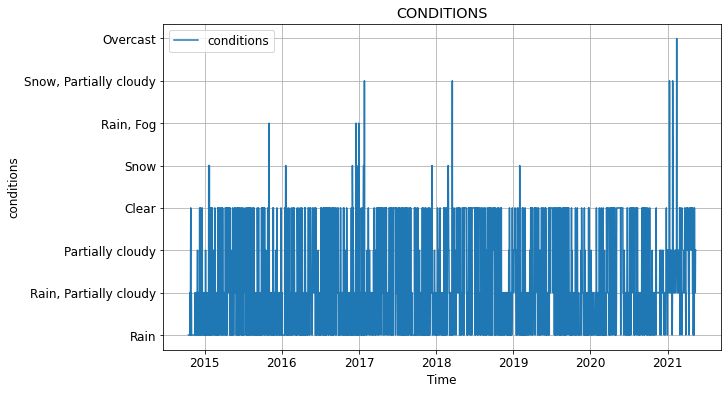

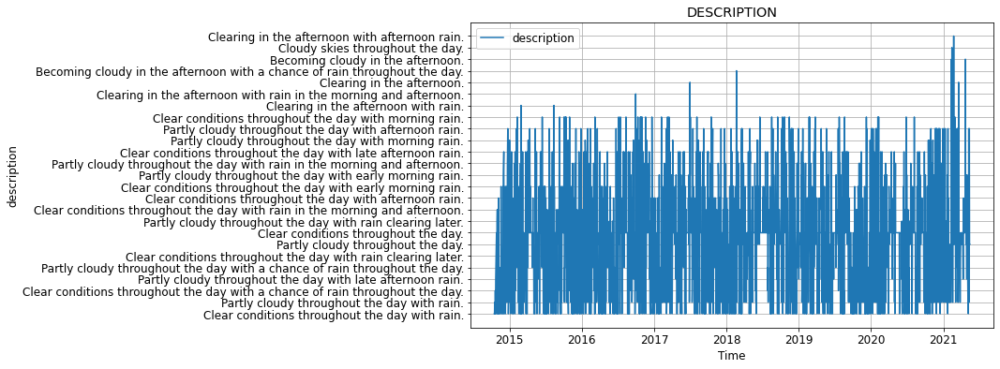

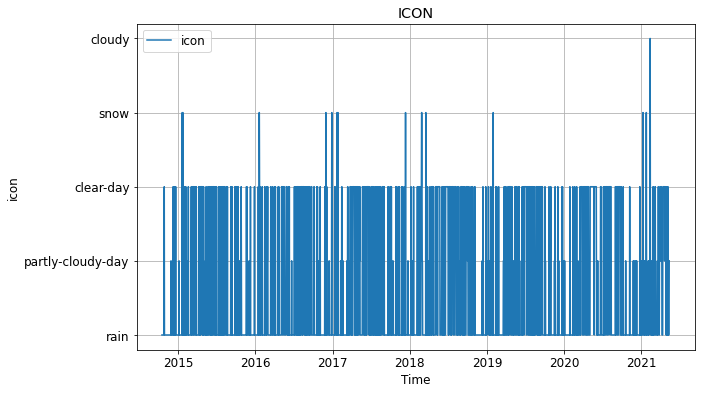

In [10]:
#time series plots
for col in df.columns:
    plotSeries(df, col)

Temperature behaving in accordance with seasons/time of year as expected.

Humidity is the inverse of temperature but more noisy.

Patterns in precipitation are not so easy to discern.

Windspeed is mostly noise centered around a mean of 13.

Strange jump in cloudcover at the end of 2020. Maybe they changed how it was measured? I wouldve liked to have modelled this but now im not so sure.

The four variables that will be modelled are: temp, humidity, precip, windspeed